:::{index} single: Report writing
:::
:::{index} single: Simulations; Report writing
:::
:::{index} single: Scenarios; Report writing
:::
:::{index} single: Simulations; the keep option
:::

:::{index} single: Scenarios; the Keep option
:::

:::{index} single: Keep; the Keep option to retain scenario results
:::



In [1]:
#This is code to manage dependencies if the notebook is executed in the google colab cloud service
if 'google.colab' in str(get_ipython()):
  import os
  os.system('apt -qqq install graphviz')
  os.system('pip -qqq install ModelFlowIb ipysheet  --no-dependencies ')


In [2]:
# Prepare the notebook for use of modelflow 

# Jupyter magic command to improve the display of charts in the Notebook
%matplotlib inline

# Import pandas 
import pandas as pd

# Import the model class from the modelclass module 
from modelclass import model 

# functions that improve rendering of modelflow outputs
model.widescreen()
model.scroll_off();

<IPython.core.display.Javascript object>

# Report writing and scenario results

`ModelFlow`, is built on the back of  and inherits the functionalities of standard pandas routines and other python libraries like [matplotlib](https://matplotlib.org/), [seaborn](https://seaborn.pydata.org/), [plotly](https://plotly.com/), and [bokeh](https://bokeh.org/). These libraries are well-integrated with dataframes, and offer a wide-range of visualization capabilities. As has been done throughout this manual, they can be used to look at data, compare simulation results among other things. 

`Mode3lFlow` users are free to employ any Python-based library for visualization purposes. For specific tasks, notably ones that seek to take advantage of `ModelFlow` internal data structures, such as the dataframes holding the results from different simulations and  for tasks common to macroeconoic scenario analysis, `ModelFlow` includes some specific procedures derived from these other packages that may be of interest. In particular, these routines are tailored to utilize `ModelFlow` metadata such as variable descriptions and include specific transformations (like growth rates) and various scenario comparison visualizations that are useful in the analysis of macroeconomic model results.

This chapter provides an overview of these features.


## Load model object and simulation results from Scenario Analysis Chapter
To begin, a solution file that was saved at the end of the previous chapter is loaded, using the by now familiar modelload function.  Because the simulations performed in the previous chapter used the keep option, and because we saved the `mpakwScenarios.pcim` file with the keep option set to true, we will have access to all the simulation results from the previous chapter.

In [3]:
mpak,_ = model.modelload(r'..\models\mpakwScenarios.pcim',run=1)


Zipped file read:  ..\models\mpakwScenarios.pcim


The `.keep_solutions` dictionary can be interrogated to list all of the solutions (the keys) that were performed and stored in the previous chapter and the dataframes that were generated when the simulations were performed (the keys) in the dictionary.

In [4]:
for key,value in mpak.keep_solutions.items():
    print(key)

    
#mpak.keep_solutions.keys() 

Baseline
$25 increase in oil prices 2025-27
2.5% increase in C 2025-40
2.5% increase in C 2025-27 -- exog whole period
2.5% increase in C 2025-27 -- exog whole period --KG=True
2.5% increase in C 2025-27 -- temporarily exogenized
1% of GDP increase in FDI and private investment (AF shock)


:::{index} single: Tables
:::

In addition the `mpak` model object includes the `.basedf` and `.lastdf` dataframes, which contain the values of model variables when initially loaded and following the latest simulation respectively.

## Table routines

Pandas includes a number of build in routines for displaying data, many of which have been used in earlier chapters.  This section summarizes some of these uses, and outlines some additional mechanisms that can be employed.

### Display levels 

The `ModelFlow` model object, `mpak`, in the examples of this manual can be used to display its internal data as a dataframe. 

The simplest way to do that is to pass to the model object a list of the variables (or a search string) of the e variable(s) whose values one might wish to inspect.  By default the values returned are those from the latest solution (the `.lastdf` dataframe).

:::{index} single: Tables; Display levels
:::

In [5]:
mpak.smpl(2023,2027) # Change global sample period to restrict output
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].df

,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2023,2.696308e+07,2.442786e+07
2024,2.739320e+07,2.481852e+07
2025,2.796323e+07,2.532326e+07
2026,2.864038e+07,2.590981e+07
2027,2.939676e+07,2.655299e+07


In this example, the display was restricted to a few years using the global smpl command. Alternatively a larger global sample period could have been retained, and the `with  set_smpl(begin,end):` construct used to show the values for a shorter time period.

In [6]:
mpak.smpl(2023,2100) # Change global sample period to 2000 2100
with mpak.set_smpl(2023, 2027):
    print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].df);

      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023    2.696308e+07    2.442786e+07
2024    2.739320e+07    2.481852e+07
2025    2.796323e+07    2.532326e+07
2026    2.864038e+07    2.590981e+07
2027    2.939676e+07    2.655299e+07


Patterns or other search parameters can be used to specify the variables to be displayed.

In [7]:
with mpak.set_smpl(2023, 2027):
    print(mpak['*NYGDPMKTP?N'].df)

      PAKNYGDPMKTPCN  PAKNYGDPMKTPKN  PAKNYGDPMKTPXN
2023    6.259407e+07    2.696308e+07        2.321473
2024    6.852862e+07    2.739320e+07        2.501665
2025    7.484111e+07    2.796323e+07        2.676411
2026    8.153469e+07    2.864038e+07        2.846843
2027    8.860694e+07    2.939676e+07        3.014174


Data from a specific time period from a specific dataframe can be displayed using the .loc syntax. Note  this construct is a pandas approach and requires a specific dataframe to work on, in this case the `lastdf` dataframe contained inside `mpak`, not `mpak` itself as in the other examples.

In [8]:
mpak.lastdf.loc['2016':'2022','PAKNYGDPMKTPKN']

2016    2.279670e+07
2017    2.421843e+07
2018    2.461013e+07
2019    2.576058e+07
2020    2.627394e+07
2021    2.651137e+07
2022    2.668514e+07
Name: PAKNYGDPMKTPKN, dtype: float64

:::{index} single: Tables; Display growth rates
:::

### Display growth rates

The growth rate of series can be displayed using standard pandas routines or using modelflow.  Note that in the modelflow representation the growth rate for the first year is displayed whereas in the pandas routine it is not.  This is because modelflow will look for lagged values outside of the active sample period, while pandas does not.

In [9]:
with mpak.set_smpl(2023, 2027):
    print('\nGrowth rates: the pandas way')
    print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].df.pct_change()*100);
    print('\n\nGrowth rates: the  ModelFlow way')
    print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].pct.mul100.df);


Growth rates: the pandas way
      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023             NaN             NaN
2024        1.595229        1.599245
2025        2.080922        2.033686
2026        2.421581        2.316270
2027        2.640940        2.482370


Growth rates: the  ModelFlow way
      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023        1.041537        1.091432
2024        1.595229        1.599245
2025        2.080922        2.033686
2026        2.421581        2.316270
2027        2.640940        2.482370


:::{index} single: Tables; Display percent change from baseline
:::

### Display percent change from baseline

The modelflow methods `.difpct` and `.mul100` and .df can be used together to create a dataframe (in this case `derived_df`) that contains the percent change in a variable between the baseline and simulated scenarios.

In [10]:
derived_df=mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].difpct.mul100.df  # difference in growth rates
derived_df

,PAKNYGDPMKTPKN,PAKNECONPRVTKN
2023,0.0,0.0
2024,0.0,0.0
2025,0.0,0.0
2026,0.0,0.0
2027,0.0,0.0
...,...,...
2096,0.0,0.0
2097,0.0,0.0
2098,0.0,0.0
2099,0.0,0.0


:::{index} single: Tables; Change display format temporarily
:::

### Change the format of outputs

In the preceding examples the formatting of outputs followed what ever the global pandas setting was.  This can be changed either permanently or using a with statement.

In [11]:
with pd.option_context('display.float_format', '{:,.2f}'.format):
    with mpak.set_smpl(2023, 2027):
        print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].pct.mul100.df);
    

      PAKNYGDPMKTPKN  PAKNECONPRVTKN
2023            1.04            1.09
2024            1.60            1.60
2025            2.08            2.03
2026            2.42            2.32
2027            2.64            2.48


The `rename()` method can be used to replace the mnemonic name with the description of the variable store in the model object.

In [12]:
with pd.option_context('display.float_format', '{:,.2f}'.format):
    with mpak.set_smpl(2023, 2027):
        print(mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].pct.mul100.rename().df);
    

      Real GDP  HH. Cons Real
2023      1.04           1.09
2024      1.60           1.60
2025      2.08           2.03
2026      2.42           2.32
2027      2.64           2.48


:::{index} single: Tables; Change display format globally
:::

or the format can be changed globally
```pd.options.display.float_format = '{:.1f}'.format```.

### Formating table outputs at the column level

For the purpose of these formatting routines a dataframe df is designed as the results of a selection from the model object `mpak`.  The df then could have the inflation rate from mpak appended to it.

Note that in this derived dataframe `df`, the column names are the English language descriptors, no longer the mnemonics which remain the variable names in the `mpak` model object.

In [13]:
df=mpak[['PAKNYGDPMKTPKN',"PAKBNCABFUNDCD_","PAKFMLBLPOLYXN","PAKNYGDPGAP_"]].rename().df.loc[2020:2030]
df["Inflation"]=mpak['PAKNECONPRVTXN'].pct.mul100.df.loc[2020:2030]
df

,Real GDP,Current Account Balance (% of GDP),Key Policy Interest Rate,Output Gap (% of Potential GDP),Inflation
2023,2.696308e+07,-3.974069,7.376232,-3.144166,7.978008
2024,2.739320e+07,-3.717770,7.362666,-4.265529,7.263911
2025,2.796323e+07,-3.554566,7.285334,-4.963704,6.674663
2026,2.864038e+07,-3.456049,7.171706,-5.367710,6.192999
2027,2.939676e+07,-3.399867,7.039316,-5.583495,5.793552
2028,3.067962e+07,-3.480432,7.012043,-4.277498,5.835550
2029,3.157187e+07,-3.425016,6.982263,-4.390696,5.674616
2030,3.244092e+07,-3.381114,6.925072,-4.639465,5.376752


#### The style.format method

The standard pandas `style.format()` method can be used to set specific formats for specific columns.  Below the first item in each pair identifies the column, the second item the formatting style to be applied.


In [14]:
df.style.format(
    {
        'Real GDP':'{:,.0f}', # use commas and . to separate out thousand millions and the decimal
        'Current Account Balance (% of GDP)':'{:.2f}%',# show only 2 decimal spots
        'Key Policy Interest Rate':'{:.1f}', # show one decimal spot
        'Output Gap (% of Potential GDP)':'{:,.1f}%', # show one decimal spot (add a % sign at the end)
        'Inflation':'{:,.1f}', # show one decimal spot        
    }
)

,Real GDP,Current Account Balance (% of GDP),Key Policy Interest Rate,Output Gap (% of Potential GDP),Inflation
2023,"26,963,078",-3.97%,7.4,-3.1%,8.0
2024,"27,393,200",-3.72%,7.4,-4.3%,7.3
2025,"27,963,232",-3.55%,7.3,-5.0%,6.7
2026,"28,640,384",-3.46%,7.2,-5.4%,6.2
2027,"29,396,759",-3.40%,7.0,-5.6%,5.8
2028,"30,679,619",-3.48%,7.0,-4.3%,5.8
2029,"31,571,869",-3.43%,7.0,-4.4%,5.7
2030,"32,440,919",-3.38%,6.9,-4.6%,5.4


### Conditional formatting -- the `.applymap()` method

It is also possible to alter the formatting of the table based on the values of specific variables.  For example, the above table can be transformed so that each row is colored as in a heat map, depending on the level of the inflation rate in that row.

The `.applymap` method can be used in conjunction with a procedure to alter the format of lines or cells depending in the value of a variable.



Below the procedure  `highlight_inflation` is defined and returns a CSS type style, depending on the value of the inflation variable and applies it to each cell in the Inflation column .

In [15]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Define the styling function
def style_specific_column(df, column):
    cm = sns.light_palette("red", as_cmap=True)
    return df.style.background_gradient(cmap=cm, subset=[column])

# Apply the styling function to the DataFrame
styled_df = style_specific_column(df, 'Inflation')
styled_df  # This will display the styled DataFrame in a Jupyter Notebook

# If you want to export the styled DataFrame to Excel, you can do so with:
# styled_df.to_excel('styled_dataframe.xlsx', engine='openpyxl', index=False)


,Real GDP,Current Account Balance (% of GDP),Key Policy Interest Rate,Output Gap (% of Potential GDP),Inflation
2023,26963077.603550,-3.974069,7.376232,-3.144166,7.978008
2024,27393200.460034,-3.717770,7.362666,-4.265529,7.263911
2025,27963231.689002,-3.554566,7.285334,-4.963704,6.674663
2026,28640384.092724,-3.456049,7.171706,-5.367710,6.192999
2027,29396759.401743,-3.399867,7.039316,-5.583495,5.793552
2028,30679619.188712,-3.480432,7.012043,-4.277498,5.835550
2029,31571868.510882,-3.425016,6.982263,-4.390696,5.674616
2030,32440919.473647,-3.381114,6.925072,-4.639465,5.376752


In this example, the value in the inflation row is tested and the whole row is returned in either a red, light red or green shape depending on the value of inflation in that row.

In [16]:

# Define the custom styling function to format rows based on 'Inflation' column
def style_rows_based_on_inflation(row):
    # Define the conditions to check 'Inflation' value
    if 5 <= row['Inflation'] <= 5.75:
        return ['background-color: lightgreen'] * len(row)
    elif 5.75 < row['Inflation'] < 6.5:
        return ['background-color: lightcoral'] * len(row)
    else:
        return ['background-color: red'] * len(row)

# Apply the custom styling function to the DataFrame
styled_df = df.style.apply(style_rows_based_on_inflation, axis=1)

# Display the styled DataFrame
styled_df


,Real GDP,Current Account Balance (% of GDP),Key Policy Interest Rate,Output Gap (% of Potential GDP),Inflation
2023,26963077.603550,-3.974069,7.376232,-3.144166,7.978008
2024,27393200.460034,-3.717770,7.362666,-4.265529,7.263911
2025,27963231.689002,-3.554566,7.285334,-4.963704,6.674663
2026,28640384.092724,-3.456049,7.171706,-5.367710,6.192999
2027,29396759.401743,-3.399867,7.039316,-5.583495,5.793552
2028,30679619.188712,-3.480432,7.012043,-4.277498,5.835550
2029,31571868.510882,-3.425016,6.982263,-4.390696,5.674616
2030,32440919.473647,-3.381114,6.925072,-4.639465,5.376752


## Graphics routines

`ModelFlow`, inherits the functionality of many python libraries, including standard pandas routines and other python libraries like [matplotlib](https://matplotlib.org/), [seaborn](https://seaborn.pydata.org/), [plotly](https://plotly.com/), and [bokeh](https://bokeh.org/). These libraries can be used in a normal python way visualize results, or users can take advantage of customizations built into the `ModelFlow` model object.

These customized `ModelFlow` methods encapsulate the functionality of he above packages (mainly mathplotlib), but also understand  modelflow internal data structures such as variable descriptions, internally stored dataframes and the kinds of specific transformations (like growth rates) that are useful in the analysis and presentation of macroeconomic data and simulation results. In particular they a user to:
1. plot one or more series from a specific  dataframe
2. plot one series from two (or more) dataframes, notably the .basedf and .lastdf dataframes
3. Compare results for one or more series from the most recent simulation or a set of scenarios that were stored using the `.solve()` method's  `keep=` option. 
    - in levels
    - differences in growth rates
    - Percent deviations from baseline levels



### Plot one or more series from a single dataframe

Modelflow encapsulates standard mathplotlib routines to allow the user to select a series from a modelobject and graph the series in a number of different ways.

#### as a level

The plot routine takes several arguments including 

|option|arguments|effects|
|:--|:--|:--|
|kind|='line','bar'|Determines the nature of the plot rendered|
|title|='some text'| Adds a customized tax|
|colrow|a number|Determines how many columns per row in the output|

The command below, therefore instructs plot to do a bar graph (type='bar'), and place the two figures generated side by side (colrow=2).

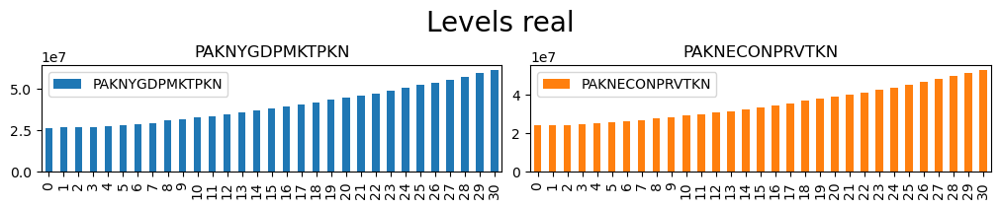

In [17]:
mpak.smpl(2020,2050)
import pandas as pd
pd.options.display.float_format = '{:.1f}'.format
_ = mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].plot(kind='bar',title='Levels real',colrow=2);




#### as a growth rate

In this example only one figure is generated, and it is shown as a line chart.  The methods `.pct.mul100` preceding the call to plot transform the data into a growth rate times 100, i.e. 
$$\bigl(\frac{x_t}{x_{t-1}}-1\bigr)*100$$

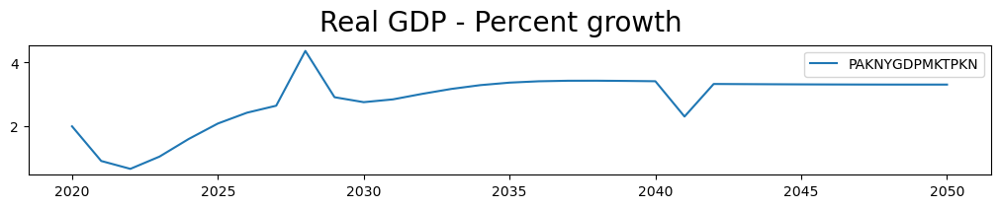

In [18]:
mpak['PAKNYGDPMKTPKN'].pct.mul100.plot(kind='line',title='Real GDP - Percent growth',colrow=1); #colrow options ensures the chart uses all of the available space


#### Multiple figures in a grid
The following command generates three graphs and place them in a grid with two graphs per row. Once again the growth rates are displayed.

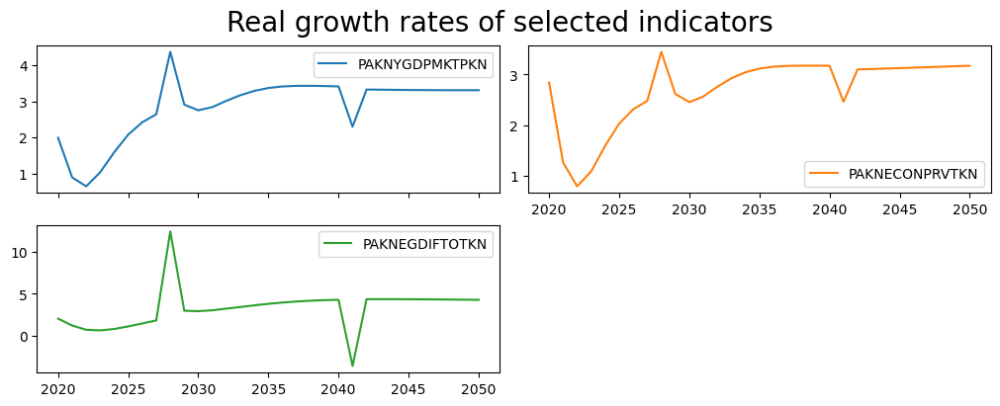

In [19]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN'].pct.\
    mul100.plot(kind='line',title='Real growth rates of selected indicators',colrow=2,top=0.4); 

:::{index} single: Modelflow; Chart routines - simulations
:::
:::{index} single: Simulations; Chart routines
:::


### Charts comparing simulation results

Recall that the model object includes both a `.basedf` dataframe with the value of variables in the baseline as well as a `.lastdf` dataframe that contains the results from the most recent simulation.

Modeflow includes routines to display graphically the change in variables across scenarios.

#### First lets run a simulation


In [20]:
#run a solution using the revised model and replacing the dataframe with the new one (exostart)  (that includes the exogenized variables) with their values.  Store thre results in a dataframecalled Baseline
# they will also be stored in mpak.latestdf

mpak.smpl(2020,2040)
update_variables = {'Carbon tax on Coal (USD/Ton)'       :'PAKGGREVCO2CER',
                    'Carbon tax on Oil (USD/Ton'         :'PAKGGREVCO2OER',
                    'Carbon tax on Natural Gas (USD/Ton' :'PAKGGREVCO2GER'}
value = 29

alternative_exo=mpak.basedf.copy()
for tax,var in update_variables.items():
        alternative_exo.loc[2020:2100,var] = value  # sets the carbon tax on all three products to value (29)
     
        
res= mpak(alternative_exo,2020,2100,alfa = 0.7,silent=1,solver = 'sim',relconv = 0.00000001) #runs the solutiona nd saves it with the name to teh left

#### Compare results from latest and baseline simulations

:::{index} single: Simulations; Chart routines - change in levels
:::

#### Change in the levels

The combination of the `.dif` and `.plot()` methods will generate a graph showing the change in the level of the variables equested

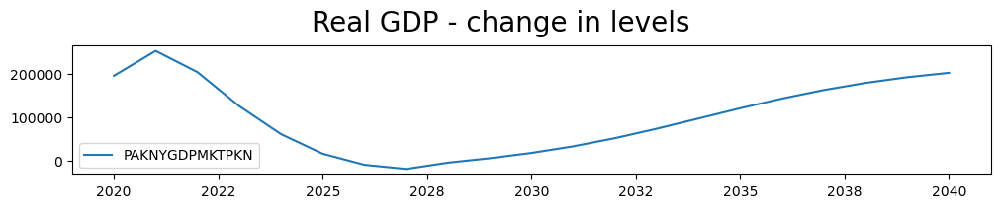

In [21]:
pd.options.display.float_format = '{:.1f}'.format
with mpak.set_smpl(2020,2040):
    mpak['PAKNYGDPMKTPKN'].dif.plot(kind='line',\
                                title='Real GDP - change in levels',colrow=1,top=0.8);

:::{index} single: Simulations; Chart routines - change in growth rate
:::

#### Change in the growth rates of variables

The combination of the `.difpct`, `.mul100` and `.plot()` methods will generate a graph showing the change in growth rate of the variables selected. If more than one variable is selected, each change in growth rate will appear in a separate figure.

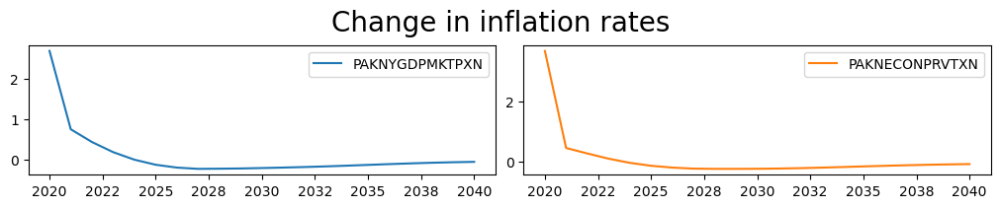

In [22]:
with mpak.set_smpl(2020,2040):
    mpak['PAKNYGDPMKTPXN PAKNECONPRVTXN '].difpct.mul100.plot(kind='line',\
                    title='Change in inflation rates',colrow=2,top=0.8,start=2020,end=2040);

:::{index} single: Simulations; Chart routines - change in growth rate
:::

#### Change in the levels expressed as a percent of their baseline values

The combination of the `.difpctlevel`, `.mul100` and `.plot()` methods will generate a graph showing the change in the level of the variables selected expressed as a % of the baseline (often referred to as an impulse response function). If more than one variable is selected, each impulse response function  will appear in a separate figure.

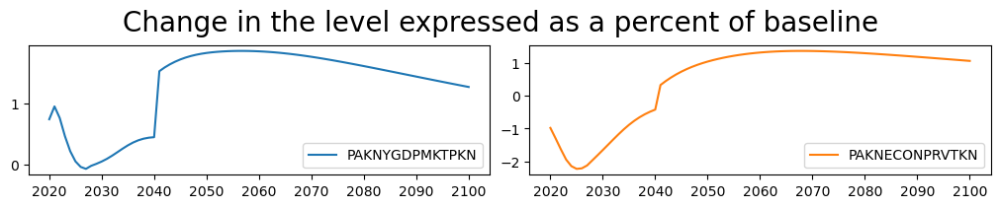

In [23]:
mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN '].difpctlevel.mul100.plot(kind='line',\
                    title='Change in the level expressed as a percent of baseline',colrow=2,top=0.8);

### Show baseline and simulation results side by side on the same graph

The `.plot_alt` method compares the levels or growth rates of a variable across the most recent and baseline scenarios.

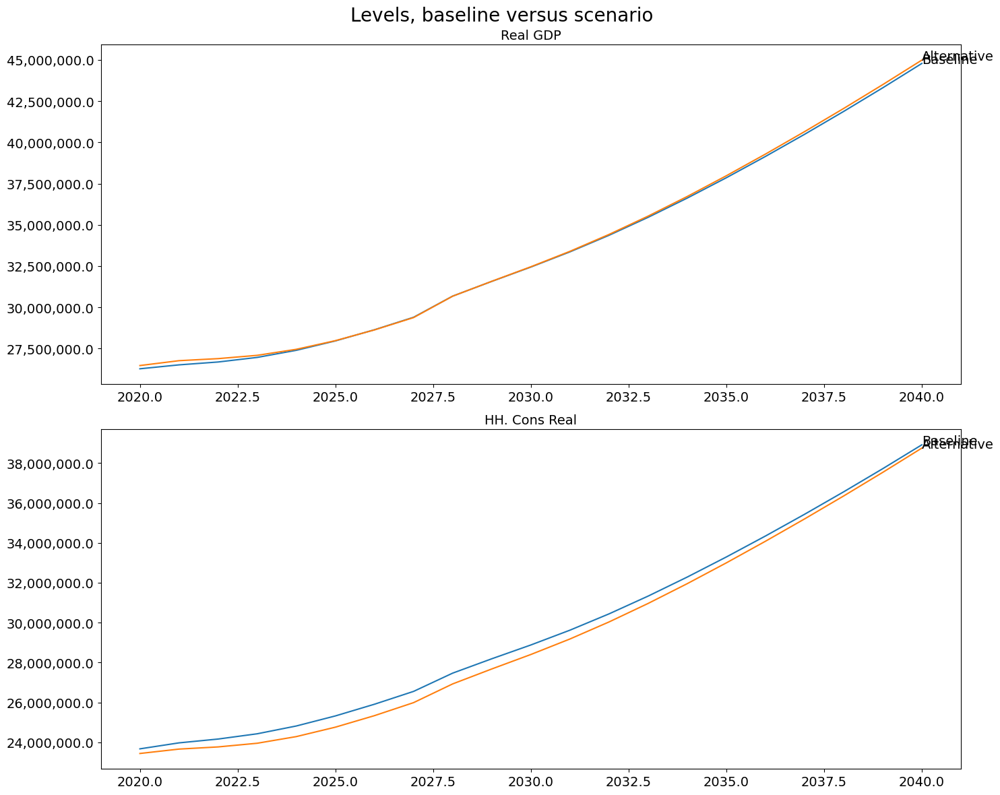

In [24]:
with mpak.set_smpl(2020,2040):
    mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].plot_alt("Levels, baseline versus scenario") ;
#    mpak['PAKNYGDPMKTPKN PAKNECONPRVTKN'].plot_alt(type="Levels, baseline versus scenario") ;

### Plot multiple series from different scenarios

Modelflow does not provide an out-of-the box way to compare multiple series from different scenarios, but this can be done with `mathplotlib` routines. In the example below the lines to be plotted are specified in separate `plt.plot` commands. In the first case, the line plotted is the result of a calculation done on the fly, while in the second a single variable is used.

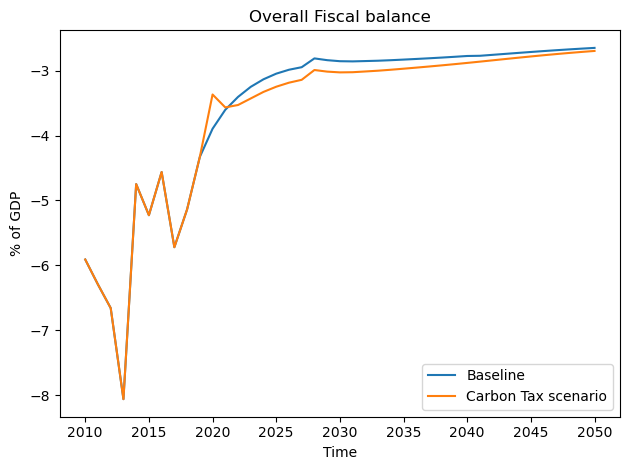

In [25]:
import matplotlib.pyplot as plt

base = mpak.basedf
alt = mpak.lastdf
plt.plot(mpak.basedf.loc[2010:2050,'PAKGGBALOVRLCN']/mpak.basedf.loc[2010:2050,'PAKNYGDPMKTPCN']*100,label='Baseline')
plt.plot(mpak.lastdf.loc[2010:2050,'PAKGGBALOVRLCN_'],label='Carbon Tax scenario')
  
# set y label
plt.ylabel('% of GDP')
  
# set x label
plt.xlabel('Time')
plt.legend()  
# set title
plt.title('Overall Fiscal balance')
  
# display plot
plt.show()


:::{index} single:Charts; multiple charts in one figure
:::
:::{index} single:Charts; Compare levels from different scenarios on one chart
:::            
:::{index} single:Charts; Mathplotlib examples with ModelFlow
:::            
:::{index} single:Mathplotlib; examples with ModelFlow
:::            

### Graphic routines for "kept" solutions

The **Keep** option facilitates the comparison of results from different scenarios run on a give model object.  In each of the simulations executed in the previous chapter, the `keep` option was activated. This caused the results from each simulation to be stored in the model object in a `DataFrame` that can be identified by the descriptor given to it.  

#### Keep_solutions
The various scenarios that have been saved in a model object are stored in a dictionary of dataframes called keep_solutions, with the keys in the dictionary being the text "names" associated with the results dataframe when the keep command was executed.  To extract a list of kept solutions, one needs to display the keys of the keep_solutions dictionary.

:::{index} single: keep option; keep_solutions
:::    
:::{index} single: keep option; keep_solutions.keys() display names of kept solutions
:::    

:::index single: keep_solutions; List stored solutions
:::
:::index single: keep_solutions; Extract dataframe from kept solutions
:::
                                

In [26]:
mpak.keep_solutions.keys()  

dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whole period', '2.5% increase in C 2025-27 -- exog whole period --KG=True', '2.5% increase in C 2025-27 -- temporarily exogenized', '1% of GDP increase in FDI and private investment (AF shock)'])

or perhaps more easily read with:



In [27]:
for  key,value in mpak.keep_solutions.items():
    print(key)  
    

Baseline
$25 increase in oil prices 2025-27
2.5% increase in C 2025-40
2.5% increase in C 2025-27 -- exog whole period
2.5% increase in C 2025-27 -- exog whole period --KG=True
2.5% increase in C 2025-27 -- temporarily exogenized
1% of GDP increase in FDI and private investment (AF shock)


The dataframes stores by the dictionary of kept solutions can be copied into temporary dataframes either for reporting purposes or in order to build a second solution on top of an initial one.

In the example below, the original baseline dataframe is assigned to a new variable oldbline and the results from the first scenario (a 25$ kike in the price of crude oil) are assigned to red_oil.  Finally the change in the for GDP are expressed as a percent of the baseline GDP over the period 2024 and 2030

In [28]:
oldbline=mpak.keep_solutions['Baseline']
resoil=mpak.keep_solutions['$25 increase in oil prices 2025-27']

print(round((resoil.loc[2024:2030,'PAKNYGDPMKTPKN']/oldbline.loc[2024:2030,'PAKNYGDPMKTPKN']-1)*100,2))

2024    0.0
2025   -0.9
2026   -0.8
2027   -0.6
2028    0.3
2029    0.5
2030    0.5
Name: PAKNYGDPMKTPKN, dtype: float64


### The keep_variables option
By default all variables are kept, if the user wishes to restrict the kept variables to a sub-set, they can do so by setting the **keep_variables** when the simulation is run, where 

For example:

```mpak(CTempExogAllKG,2020,2040,keep='2.5% increase in C 2025-27 -- exog whole period --KG=True',keep_variables='PAKNYGDPMKTPKN PAKNE*KN PAKEM*') ```

would run a simulation between 2020 AND 2040 CALLED 2.**5% increase in C 2025-27 -- exog whole period --KG=True** but keep only the variables that matched the search string in keep_variables.

By the same token, any search criteria could be used to define the set of keep_variables, for example:

`keep_variables='#MyGroup'` would cause the system to retain the variables designated in that group, or
`keep_variables='!*invest*'` would cause the system to retain the variables whose descriptions matched the search string `'*invest*'`.

Thus, to preserve say real GDP, the current account balance and the government deficit, one might define a new Group say ReportVars as below:


In [29]:
mpak.var_groups['ReportVars']="PAKNYGDPMKTPKN PAKBNCABFUNDCD_ PAKGGBALOVRLCN_"


By executing scenarios with `keep_variables='#ReportVars'` option set, the results for these variables would be stored under the name of the scenario.

:::{index} single: Simulations; Report-writing - the keep_plot method
:::
:::{index} single: Scenarios; Report-writing - the keep_plot method
:::
:::{index} single: Keep_solution dictionary
:::
:::{index} pair: Keep_solution; keep_variables
:::





#### The `.keep_plot()` method

The keep_plot method can be used to plot and compare results from the various scenarios that had been run earlier using the `keep=` option. 


First, reload the results from the simulations done in the preceding chapter the keep option was used to save in the model object the results of each simulation.  


In [31]:
mpak,_ = model.modelload(r'..\models\mpakwScenarios.pcim', run=True)
mpak.smpl(2020,2040);

Zipped file read:  ..\models\mpakwScenarios.pcim


By default the results across all scenarios for each selected variables will be shown on one chart at a time (`keepdim=true`).  NB: the 2020,2040 restricts output to the period 2020 2040 the period over which the shocks were run.  Without that the graphs would display for the whole time period defined in the `model object` `mpak`.

By default each series returned by the selector (three in this instances) is rendered in a separate graph that compares results across **kept** scenarios.


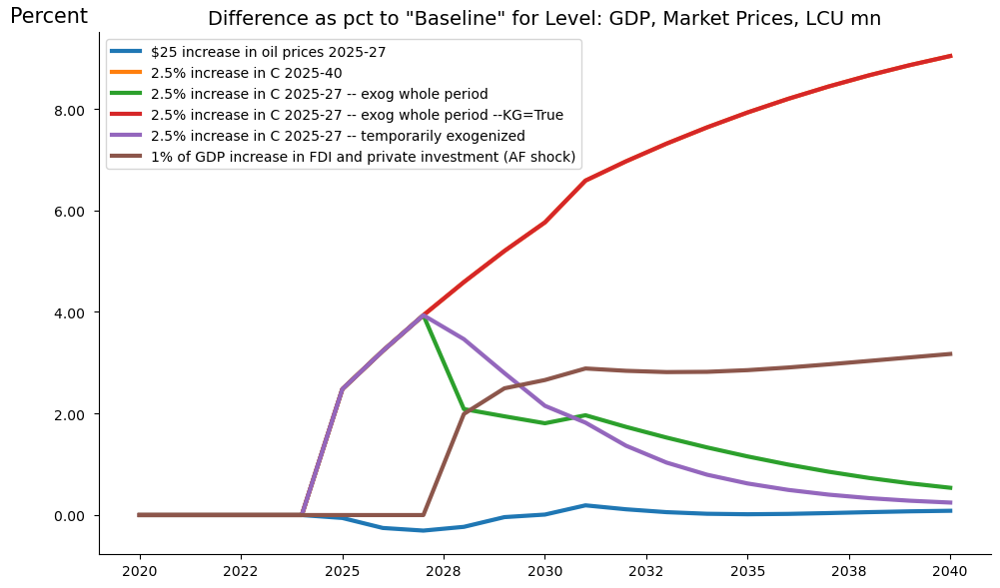

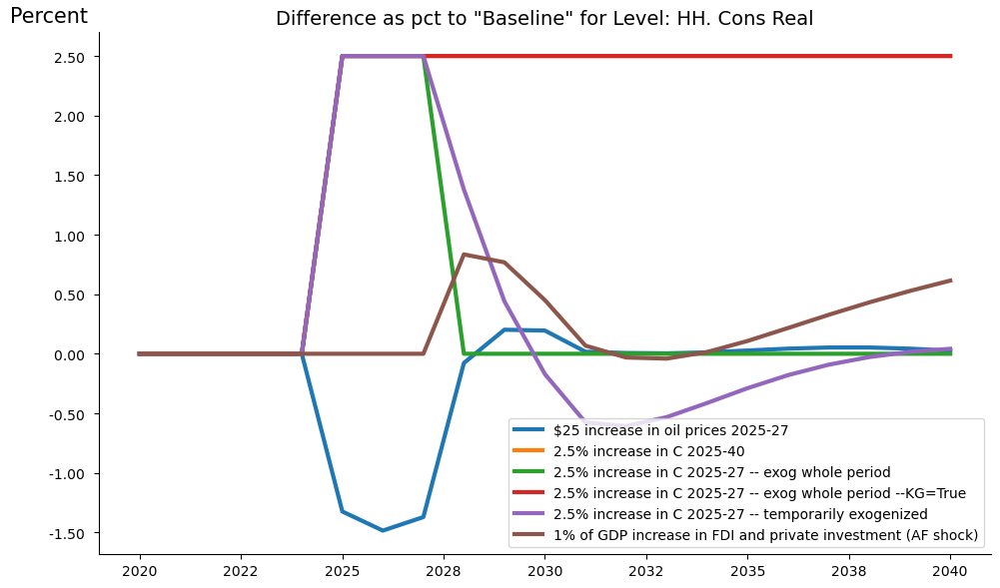

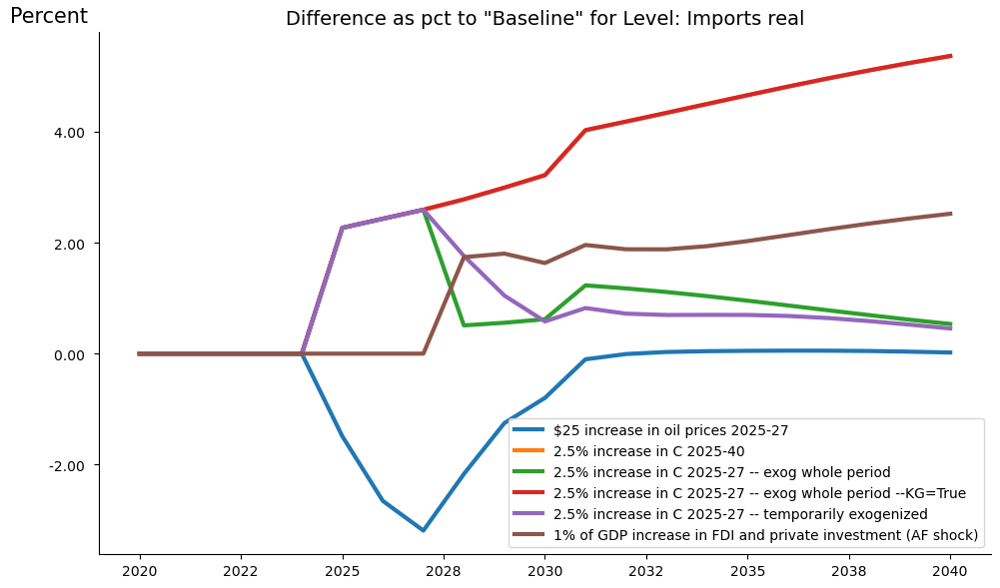

In [40]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNECONPRVTKN PAKNEIMPGNFSKN',2020,2040,  legend=True,diffpct=True);
#show for each variable on a separate chart the results from each kept scenario

:::{index} single: Scenarios; report-writing - keep_plot options
:::
:::{index} single: Simulations; report-writing - keep_plot options
:::
:::{index} single: Keep_plot; options
:::



#### `keep_plot()` options


|options|arguments|example(s)|Explanation|
|:--|:--|:--|:--|
|pat|list of variable mnemonics or search critiera|pat='PAKNE\*KN'; pat='#MyGroup'; pat='PAKNYGDPMKTPKN PAKNECONPRVTKN'|Defines the variables to be retained after the simulation|
|start, end|a date|start=2020;end=2040| Restricts output to the time-period indicated|
|showtype|'level';'growth';'change' | showtype="growth";showtype="level";showtype="dif" | Displays the plot using the level, growth rate or change in the level of the variable|
|legend|True, False|Legend=True| True:Legend placed inside the graph; False: Legend follows each line  |
| diff |True; False (default) |True: graphs are expressed as the difference with respect to the first scenario in the kept library|
| diffpct |True; False (default) |True: graphs are expressed as the percent difference **with respect to the first scenario in the kept Library**|

 
 **Other parameters**
 
 | Parameter       | Type            | Description                                                                                      |
|:-----------------|:-----------------|:--------------------------------------------------------------------------------------------------|
| `start_ofset`   | int             | Relative offset for the start period from the current period. Defaults to 0.                      |
| `end_ofset`     | int             | Relative offset for the end period from the current period. Defaults to 0.                        |
| `mul`           | float           | Multiplier for the data. Defaults to 1.0.                                                         |
| `title`         | str            | Title for the plot. Defaults to 'Show variables'.                                                 |
| `scale`         | str            | Scale of the plot ('log' or 'linear'). Defaults to 'linear'.                                      |
| `yunit`         | str            | Units for the y-axis. Defaults to ''.                                                             |
| `ylabel`        | str            | Label for the y-axis. Defaults to ''.                                                             |
| `dec`           | TYPE            | Number of decimals to display, automated if ''. Defaults to ''.                                   |
| `trans`         | dict            | Translation dictionary for variable names. Defaults to None which implies .var_description. To get the clean variable name use {}                                         |
| `showfig`       | bool            | If False, the figure is not displayed. Defaults to True.                                          |
| `vline`         | list of tuples  | List of (time, text) for vertical lines on the plot. To erase, delete `model.vline`.              |
| `keep_dim`      | bool            | If True, each line represents a scenario; if False, each line represents a variable. Defaults to True. |
| `dataonly`      | bool            | If True, only the resulting data frames are returned, no plot is shown. Defaults to False.        |

 :::{note}
`'keep_plot()` returns a dictionary of Matplotlib figure objects, with keys being the variable names. return a python object that points to the in memory version of the rendered figure(s).  The values  can be used to modify the graph (see examples towards the end of this chapter).
 
 :::
 
:::{index} single: Keep_plot; savefig 
::: 
 
 

:::{index} single: Scenarios: Keep_plot examples - the diff option
:::
:::{index} single: Simulations: Keep_plot examples - the diff option
:::
:::{index} single: Keep_plot; examples - the diff option
:::

##### An example using the diff=True option

When `diff=True` (or 1) results from all kept scenarios will be presented as the level change in selected variables **with respect to the first scenario** in the keep list. -- in this instance the scenario saved with the name `baseline` (for memory these are stored in the dictionrary keep_solutions and can be visualized with the code snippet below).  

```
for  key,value in mpak.keep_solutions.items():
    print(key)
```

:::{warning}
Note in this instance `baseline` and `basedf` are the same because they were defined that way.  However, there is nothing in the system that guarantees that the first `keep` scenario will be the baseline or the `basedf` scenario.
:::

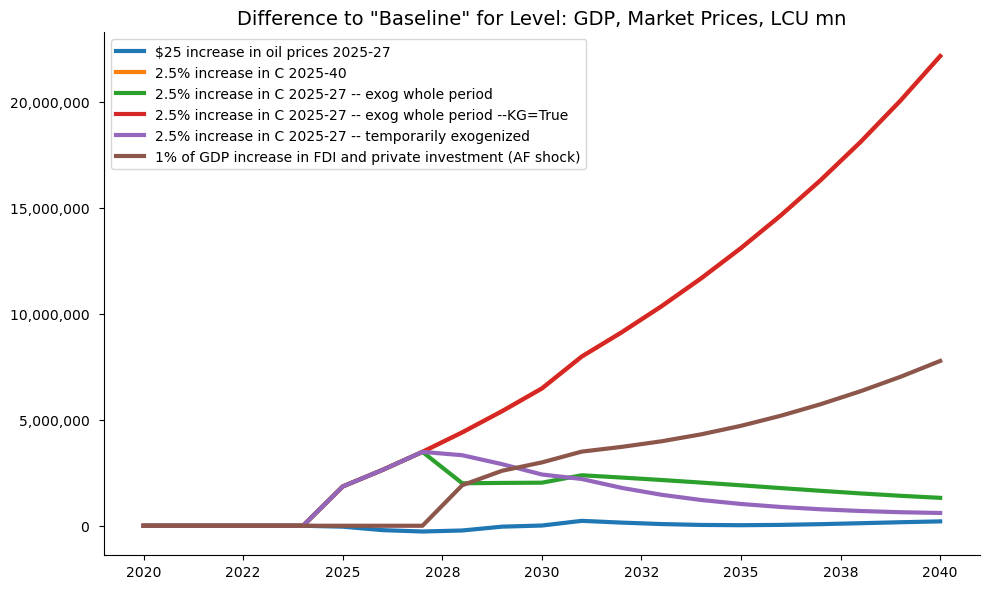

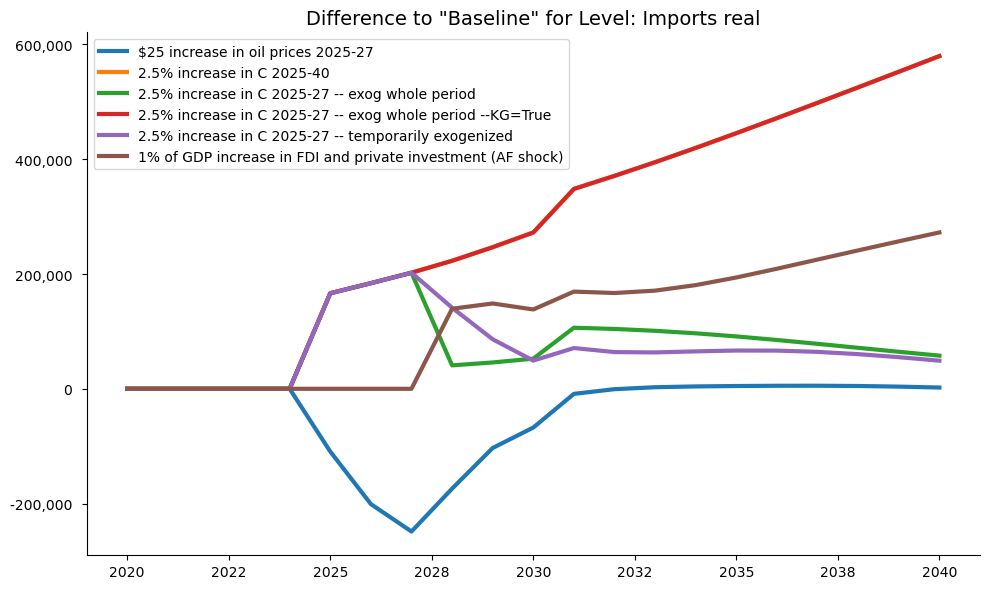

In [27]:
#Set the default period for the mpak object to 2020 2040
# because of this future calls to keep_plot or anyother model objkect method
# will operate over the period 2020 2040 only.
mpak.smpl(2020,2040) 
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1, legend=True);

:::{index} single: Scenarios; Keep_plot examples - showtype=growth
:::
:::{index} single: Simulations; Keep_plot examples - showtype=growth
:::
:::{index} single: Keep_plot; examples - showtype=growth
:::

##### The `showtype` option

In this example the difference with respect first `'keep` scenario `baseline` values are once again shown. This time the `showtype` option has been set to `growth`.  As a result the data is displayed as the  difference in the growth rates between the simulation scenarios and the growth rate in the `baseline` scenario -- remembering that keep_plot is calculating the differences with respect to the first kept scenario. Its name need not have been baseline, this was just a decision made in preparing the shocks that facilitated the kind of comparisons to be displayed. 

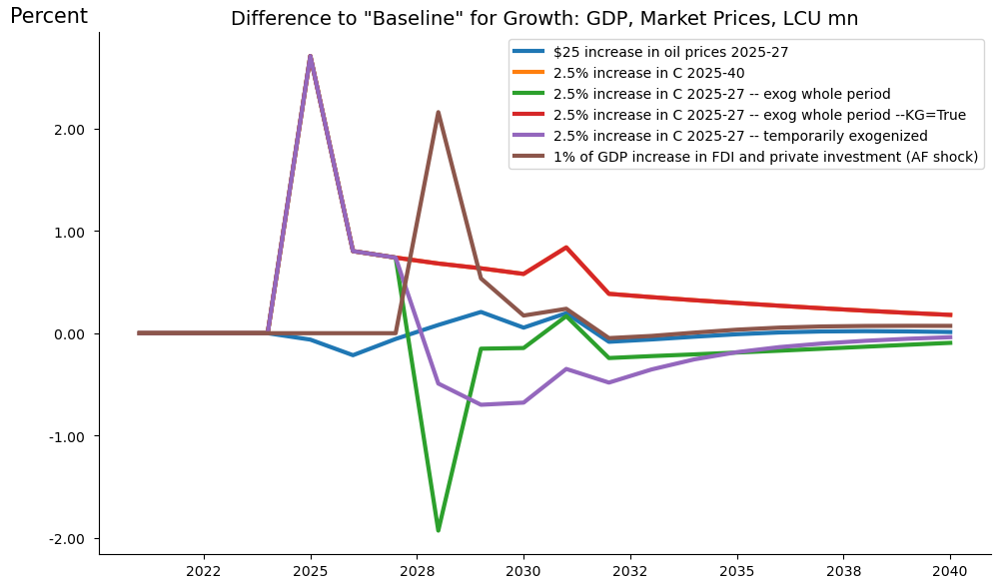

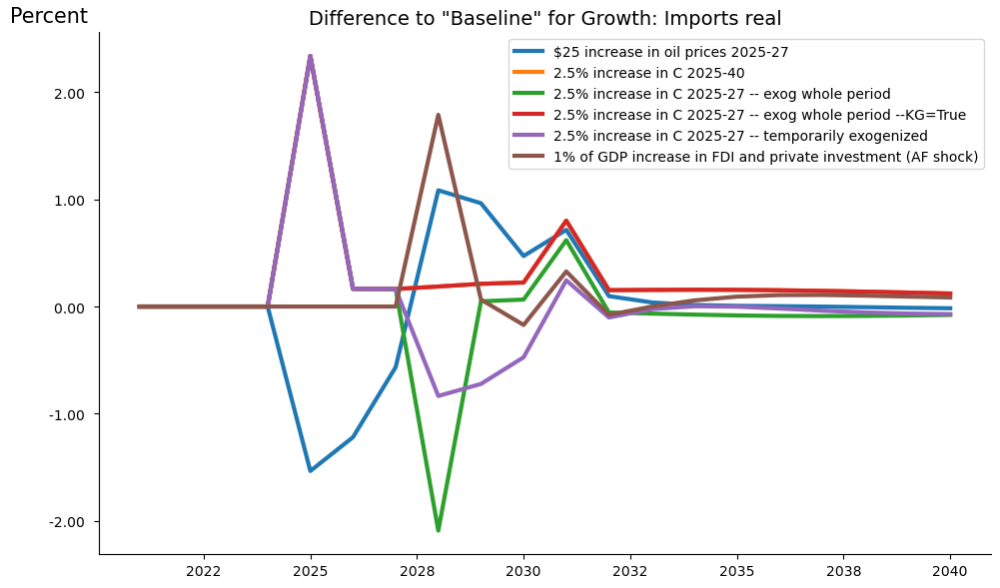

In [28]:
mpak.keep_plot('PAKNYGDPMKTPCN PAKNEIMPGNFSKN', diff=1,showtype='growth', legend=True);


:::{index} single: Scenarios; Keep_plot examples - showtype=diffpct
:::
:::{index} single: Simulations; Keep_plot examples - showtype=diffpct
:::
:::{index} single: Keep_plot; examples - showtype=diffpct
:::



##### The diffpct option

Setting `diffpct=True` instructs `.keep_plot()` to display the data as a percent deviation from the first `kept` scenario, which in this case was the baseline scenario.
$\big(\frac{x_{shock}-x_{original}}{x_{shock}}\big) * 100$

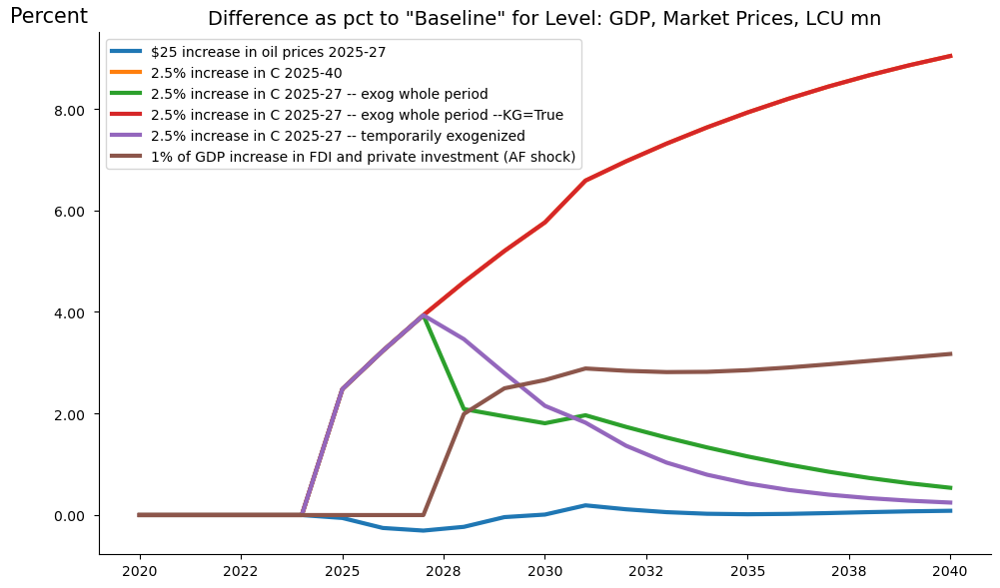

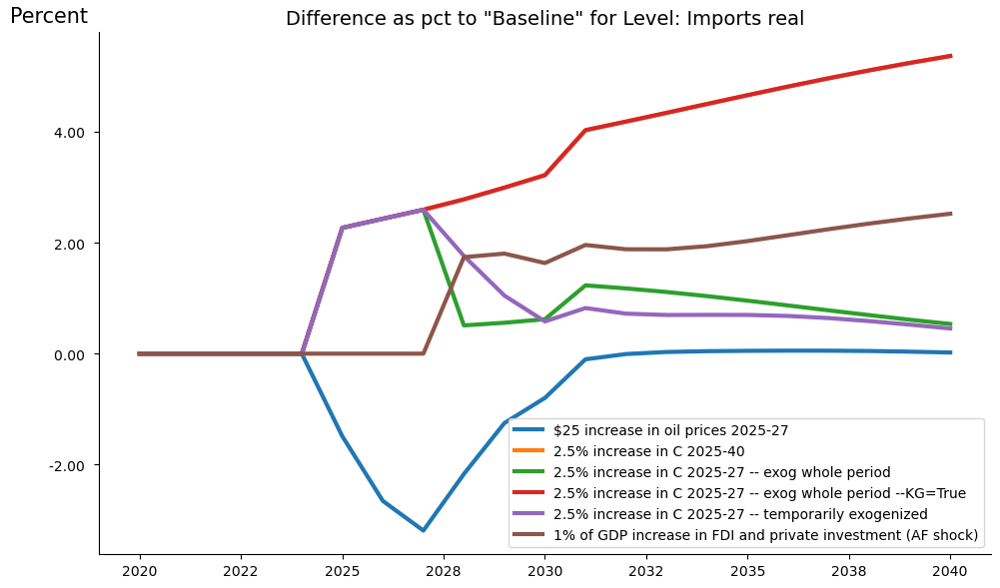

In [29]:
mpak.keep_plot('PAKNYGDPMKTPCN  PAKNEIMPGNFSKN', diffpct=True,showtype='level',legend="Change in level as a % of first keep scenario");




:::{index} single: keep_solutions.keys()
:::
:::{index} single: Simulations; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
:::
:::{index} single: Compare solutions; keep_plot options -- keep_switch -- specify the kept scenarios to be displayed
:::

:::{index} single: keep_plot options; keep_switch -- specify the kept scenarios to be displayed
:::


#### The `.keep_switch()` method

The `.keep_switch()` method restricts the number of scenarios on which subsequent calls to `.keep_plot()` are executed on.  `.keep_switch()` can be passed a list of scenarios or using a wildcard selector (see examples below).

##### The `.keep_solutions.keys()` method 
The `.keep_solutions.keys()` method displays a list of the solutions that have been kept previously.

In [30]:
mpak.keep_solutions.keys()


dict_keys(['Baseline', '$25 increase in oil prices 2025-27', '2.5% increase in C 2025-40', '2.5% increase in C 2025-27 -- exog whole period', '2.5% increase in C 2025-27 -- exog whole period --KG=True', '2.5% increase in C 2025-27 -- temporarily exogenized', '1% of GDP increase in FDI and private investment (AF shock)'])

To specify exactly which scenarios to show in a keep_plot, the `scenarios=` option of `.keepswitch()` must be initialized with a "|" delimited string of the names of the scenarios (retrieved above) that are to be displayed.

By placing the `.keepswitch()` in a `with` clause the scenario restriction will only apply to indented lines that follow the with construct.

As before the scenarios are compared with the first scenario in the keep dictionary, which in this instance happens to be named 'baseline'.

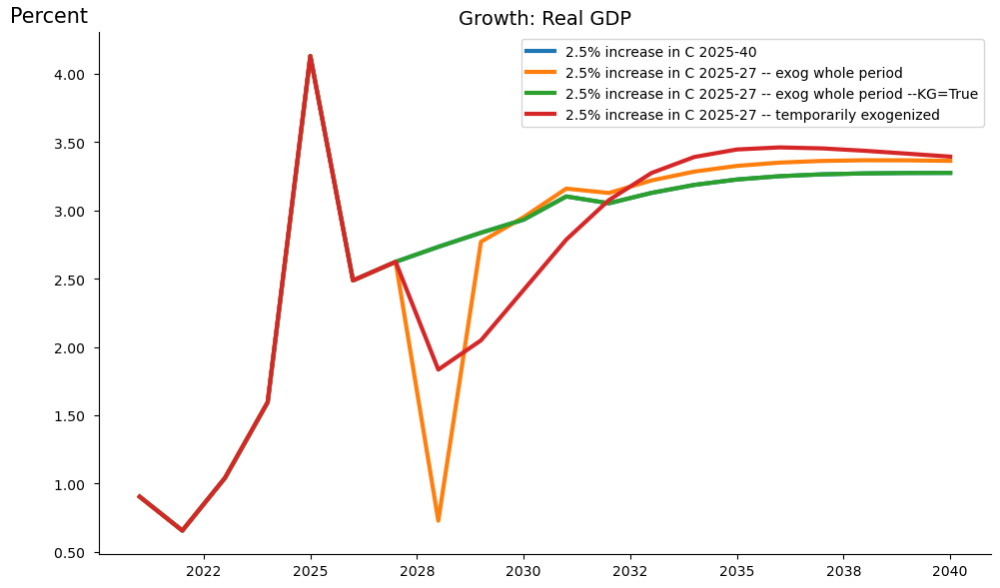

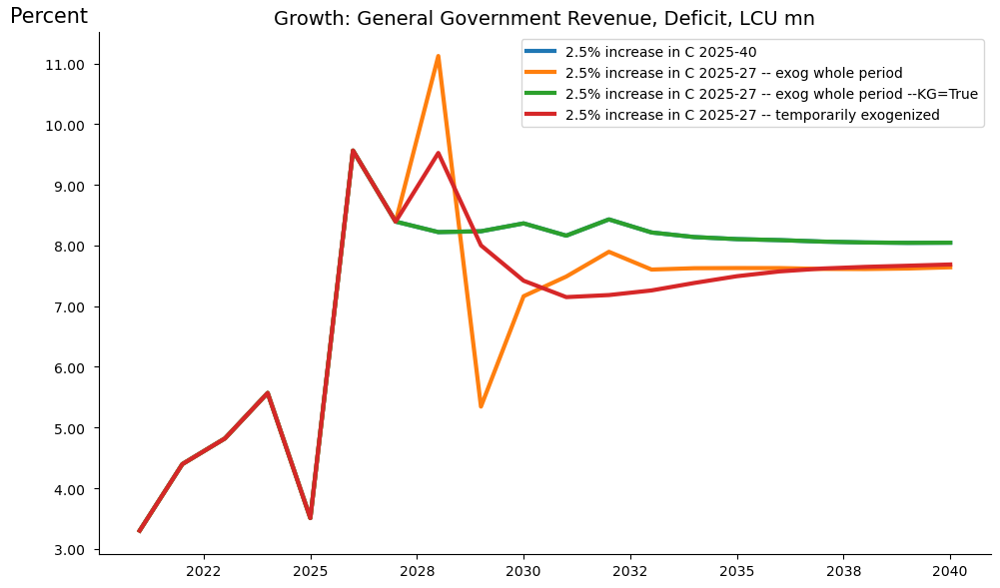

In [31]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDEBTTOTLCN',start=2020,end=2040,diff=False,showtype='growth',legend=True);

:::{index} single: keep_plot; keep_dim option
:::
:::{index} single: keep_plot; keep_dim=False
:::
:::{index} single: Simulations; Graphical comparison of solutions ordered by variable
:::
:::{index} single: scenarios; Graphical comparison of solutions ordered by variable
:::



##### keep_plot with keep_dim=False

When Keep_dim is set to False keep_plot shows all pf the selected variables for each scenario on a single chart (rather than the default behavior of the results for each variable across  the various scenarios on one plot.

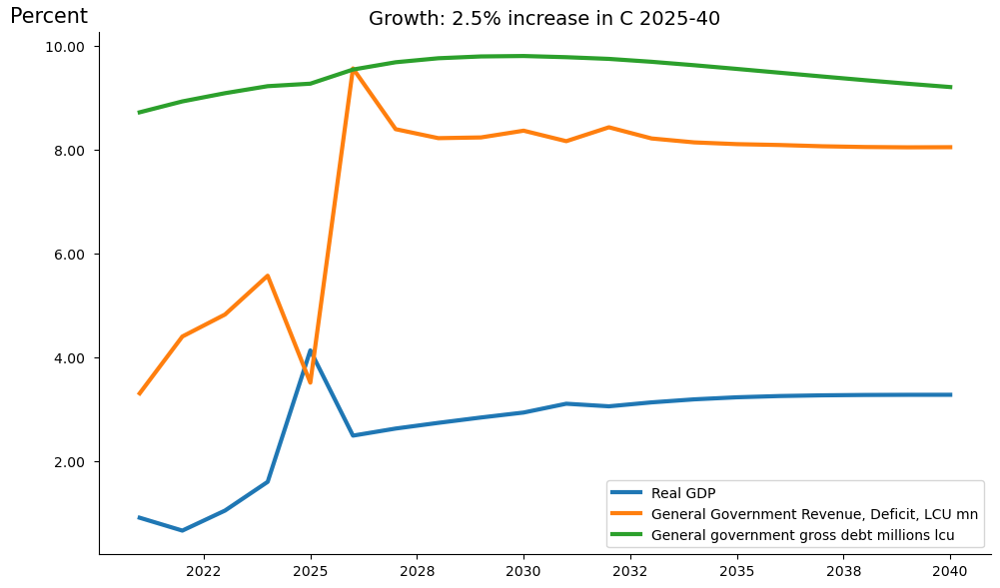

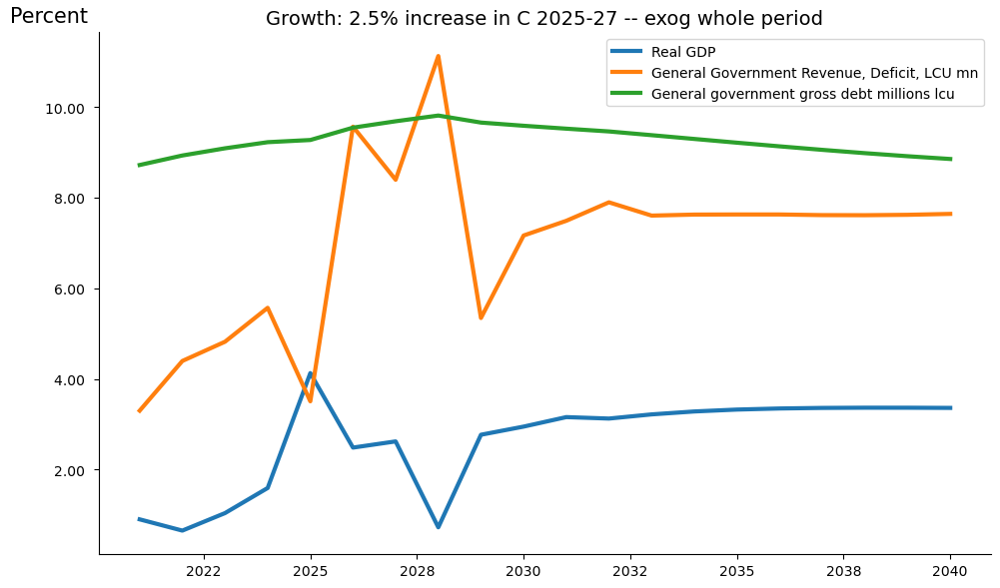

In [32]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDBTTOTLCN',start=2020,end=2040,diff=False,showtype='growth',legend=True,keep_dim=False);

:::{index} single: keep_switch; selection using wildcard
:::
:::{index} single: Simulations; Compare solutions - keep_switch with wildcard
:::
:::{index} single: Scenarios; Compare solutions - keep_switch with wildcard
:::



##### The `.keep_solutions.keys()` method with diff=True

If .keep_plot() is called on a sub-set of the kept solutions, the comparison will be made relative to the first scenario in the .keep_switch call.

Thus in the example below (which repeats the previous call, but sets diff=True, all of the shocks are calculated relative to the shock named '2.5% increase in C 2025-40'.  Thus there are only three lines (not four as when diff=False).



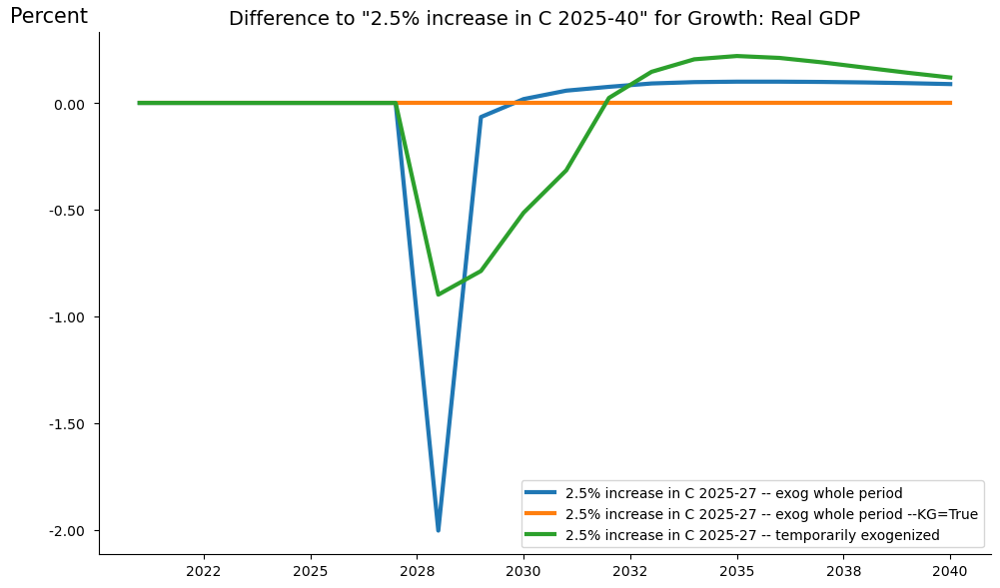

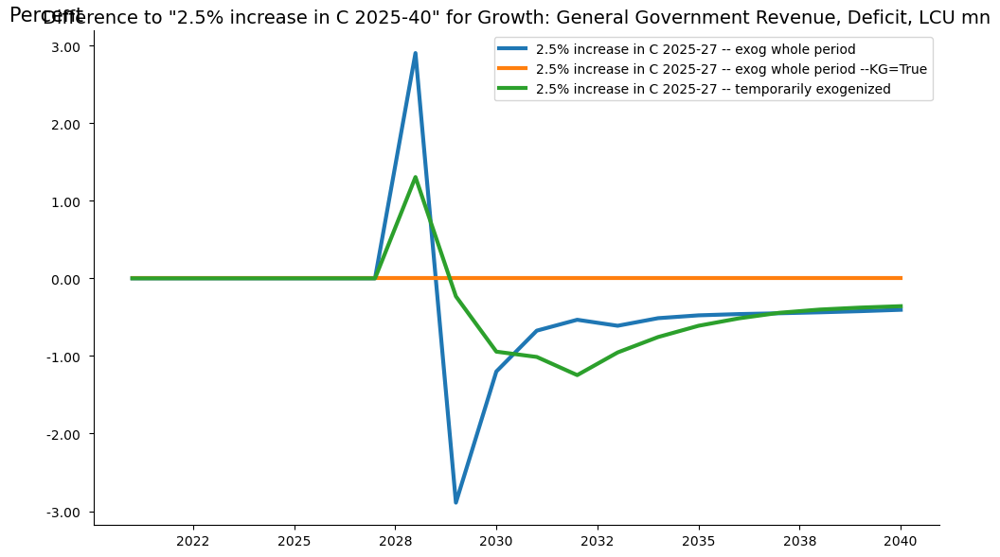

In [33]:

with mpak.keepswitch(scenarios='2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN ',start=2020,end=2040,diff=True,showtype='growth',legend=True);

If, as before, the objective was to compare the four scenarios with the baseline scenario, the baseline scenario would have to be added to the .keep_switch() call as below:



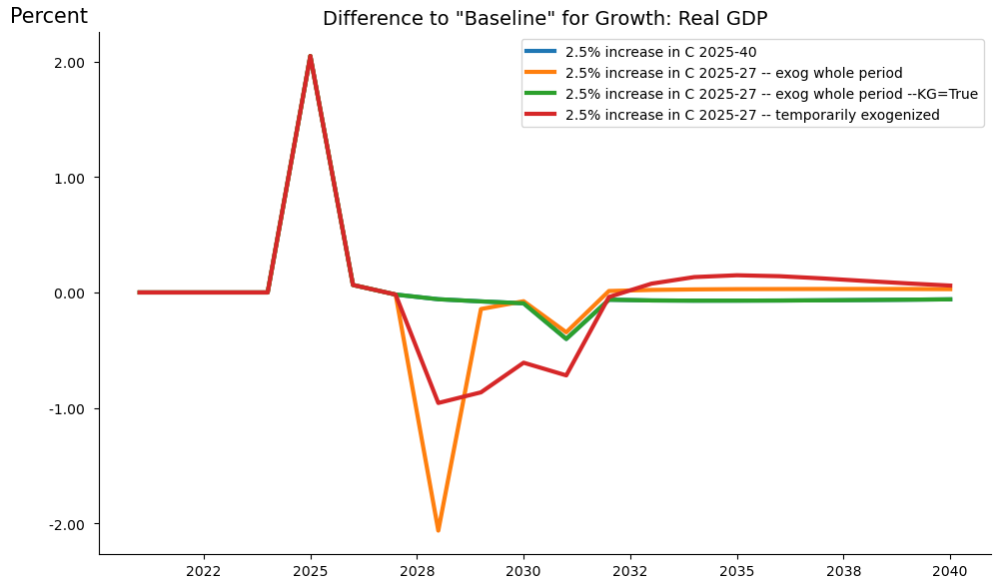

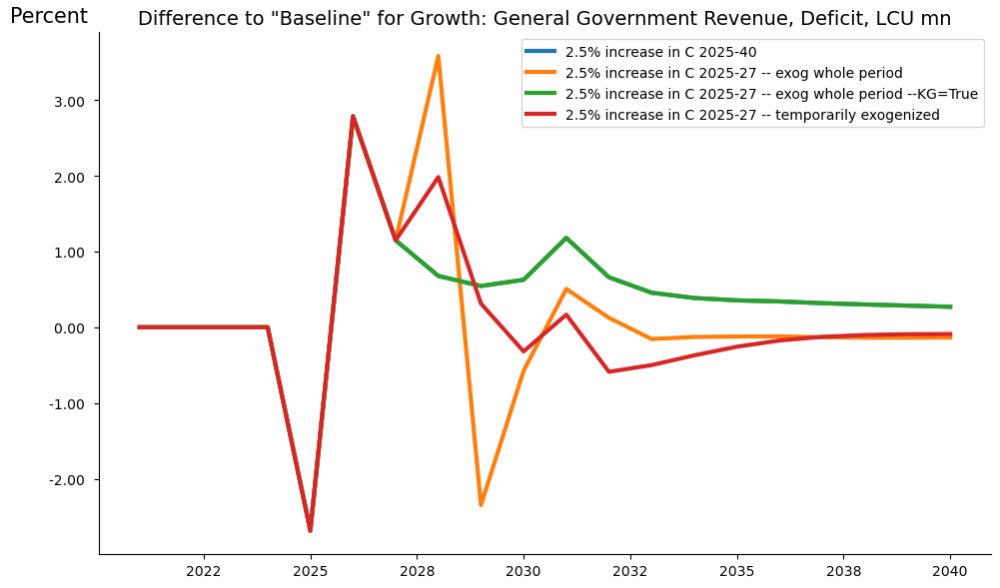

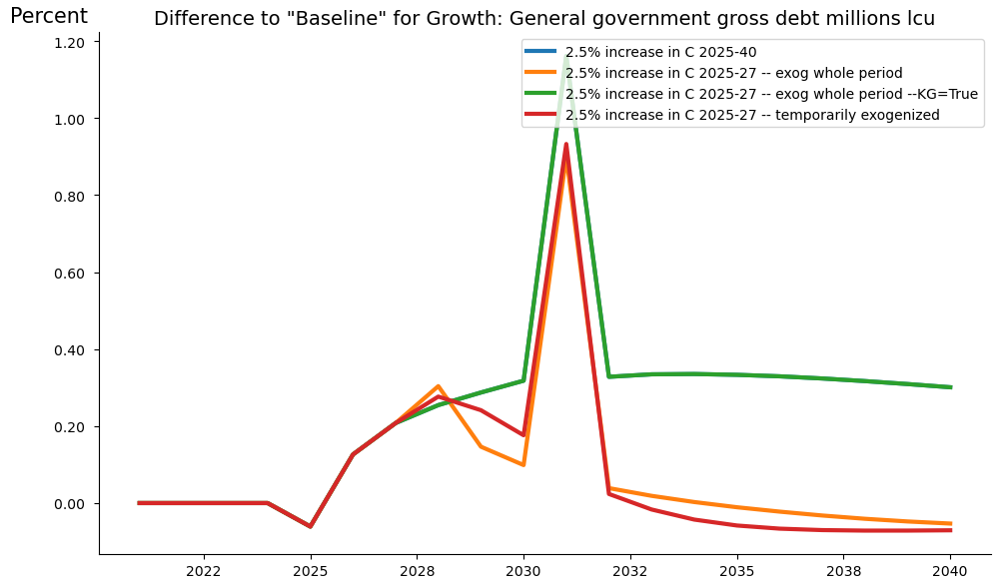

In [34]:

with mpak.keepswitch(scenarios='baseline|2.5% increase in C 2025-40|2.5% increase in C 2025-27 -- exog whole period|2.5% increase in C 2025-27 -- exog whole period --KG=True|2.5% increase in C 2025-27 -- temporarily exogenized'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKGGBALOVRLCN PAKGGDBTTOTLCN',start=2020,end=2040,diff=True,showtype='growth',legend=True);

:::{warning} .keep_switch() and .keep_plot() with option diff=True

When the .keep_plot() option diff is set to True, the figures will be generated as comparisons with the values of the first scenario specified in the .keep_switch() command.  In most instances users will want to use the baseline scenario as this comparison point.  Failure to do so when this was the intention/expectation of the user, will generate unexpected results.

:::

:::{index} single: keep_switch; selection using wildcard
:::
:::{index} single: Simulations; Compare solutions - keep_switch with wildcard
:::
:::{index} single: Scenarios; Compare solutions - keep_switch with wildcard
:::



#### Keepswitch with wildcard selection

Below a series of plots are generated using a wildcard selector in the keepswitch clause.

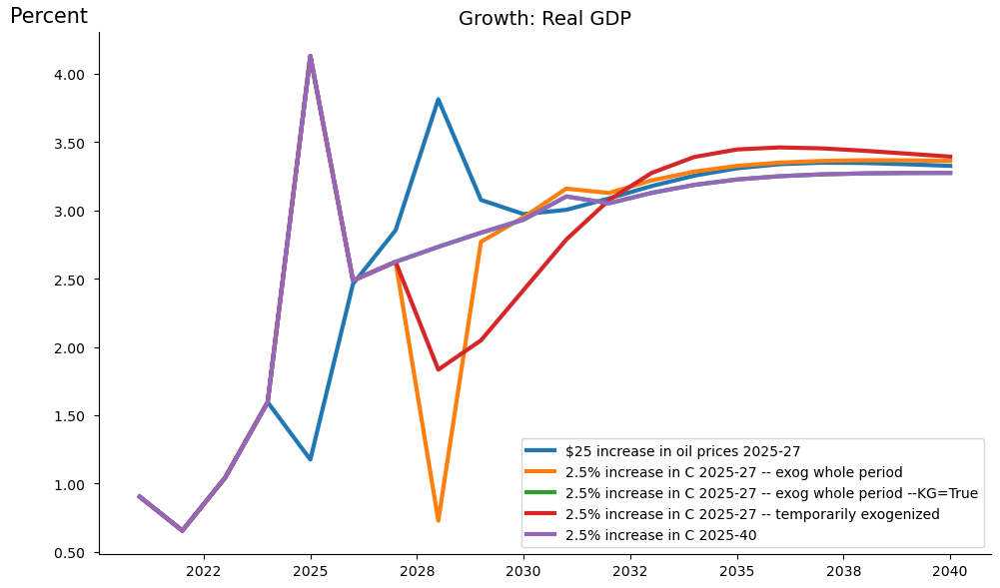

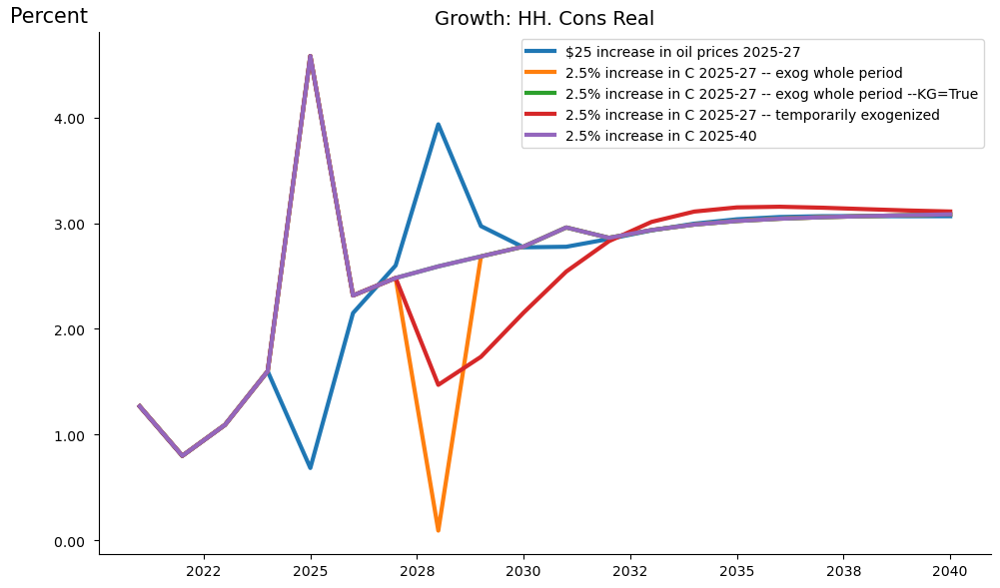

In [35]:

with mpak.keepswitch(scenarios='*2025*'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN',showtype='growth',legend=True,start=2020,end=2040);

:::{index} single: Simulations; Report-writing - comparison of scenario results impacts on multiple series
:::
:::{index} single: Simulations; Compare solutions - comparison of scenario results impacts on multiple series
:::
:::{index} single: .keep_plot() method; samefig=True option: Compare solutions - comparison of scenario results impacts on multiple series
:::



#### `.keep_plot() ` with `samefig=True` 

The `samefig=True` method allows several charts to be displayed in a grid.  The size of each chart can be set with the `size=(w,h)` option, where the units of width and height are in **inches**.  

Then  `samefig=True`  is used. `keep_plot()` will return a dictionary with only one key which is `'onefig'` 

The parameters `ncol` and `size` can be used to get the desired visual expression. 

| Argument     | Description                                                                                        | Default    |
|:--------------|:----------------------------------------------------------------------------------------------------|------------|
| `ncol`       | Number of columns for subplots when using samefig.                                                 | 2          |
| `size`       | Figure size as (width, height).                                                                    | (10, 6)    |


Also note that the parameters `ncol` with default value of 2 and `size`  

Also if `legend=1` The legend will only be shown once - at the bottom of the charts

Returns a dictionary of figures, with the key 'onefig' pointing to the combined figure, the graphs that comprise it are axes[0], axes[1]....

```
figures=themodel['VAR1 VAR2'].plot(samefig=True)
thecombofig=figures['onefig']
thecombofig.axes[0].set_title("Change the title of the first figure in the combo')

```



#### `.keep_plot` with `keep_dim=False`

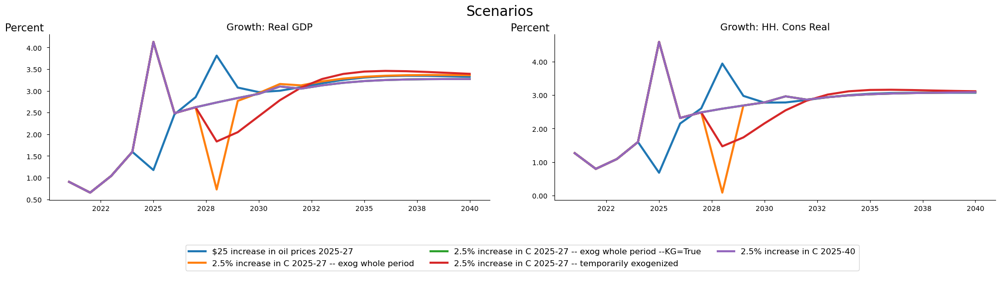

In [36]:

with mpak.keepswitch(scenarios='*2025*'):
    mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN',showtype='growth',legend=True,start=2020,end=2040
                  ,samefig=True);

### Modifying figure objects

As indicated earlier  `keep_plot()`  return a dictionary containing either:
 - if `samefig=False` A matplotlib figure object for **each** variable.
 - if `samefig=True` One matplotlib figure object with **a grid of charts** for each sub-chart from which the figure is comprised. 
 
The content of the dictionary  can be used to embellish or modify the figures produced by the automatic routines.

The command

``` 
var_figs = mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2040,keep_dim=0,samefig=True,
            legend=1,size=(20,20) ,diffpct=True,title='Scenario Comparison'  );
            
combofig=-varfigs['onefig']
The_first_chart=combofig.axes[0]
The_second_chart=combofig.axes[0]
```

returns a dictionary of several figures, which in this case is assigned to a python object var_figs.  

The key 'onefig' returns the object that contains all of the charts of which the combo chart is comprised, names axes[0], axes[1] etc.





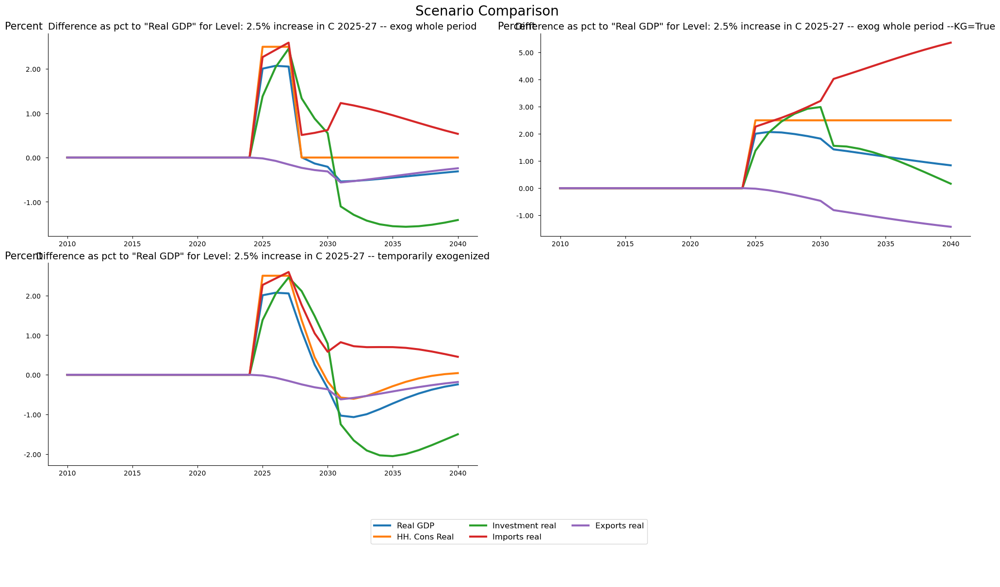

In [37]:
with mpak.set_smpl(2000,2040):
    with mpak.keepswitch(scenarios="baseline *exog*"):
        var_figs = mpak.keep_plot('PAKNYGDPMKTPKN PAKNECONPRVTKN PAKNEGDIFTOTKN PAKNEIMPGNFSKN PAKNEEXPGNFSKN',2010,2040,keep_dim=0,legend=1
                                ,samefig=1 ,
                                  diffpct=True,title='Scenario Comparison'  );

:::{index} single: Graphs; Modify size of already generated figures
:::

#### Change the size of charts



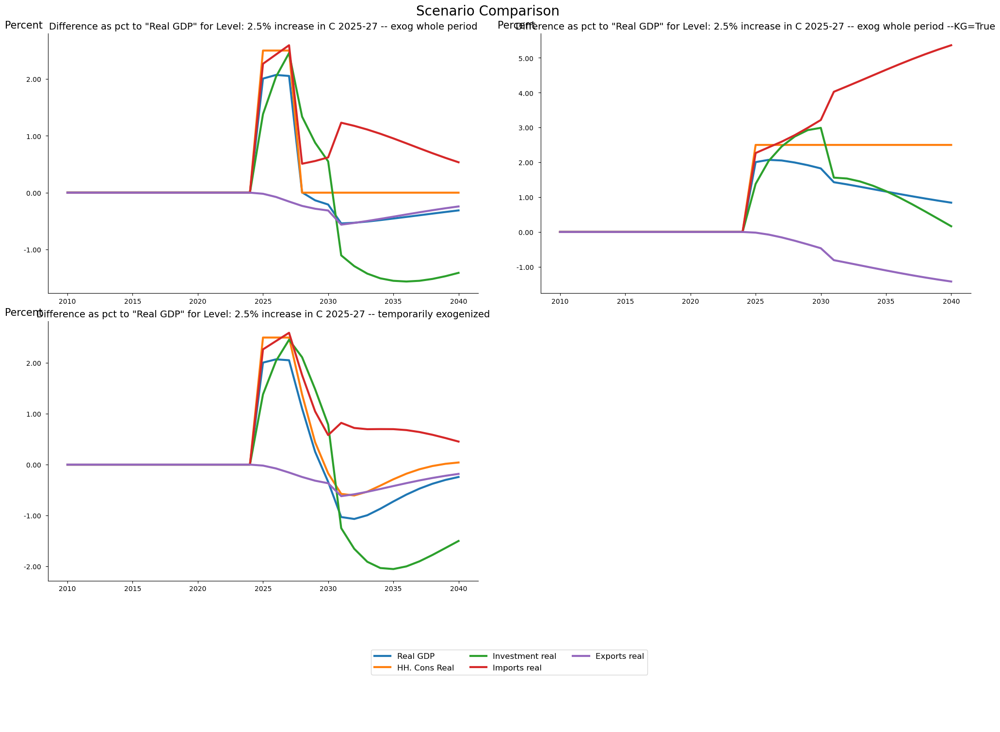

In [38]:
var_fig = var_figs['onefig']
var_fig.set_size_inches(20,15)
var_fig

Individual charts can be deleted from the grid.  

:::{note}
The grid representation of the individual charts is returned as a 0-based vector of charts.  Thus the first figure is the zeroeth and the second is the first.
:::

:::{index} single: Mathplotlib; plots - Delete figure from grid of charts 
:::
:::{index} single: Report-writing; Delete figure from grid of charts (mathplotlib functionality)
:::



### Delete a chart from the grid

A chart can be deleted from the grid by referencing (`axes[1]` here for the second chart) it and calling the `.remove()` method. 

In this example the second chart (index number 1) is  removed.

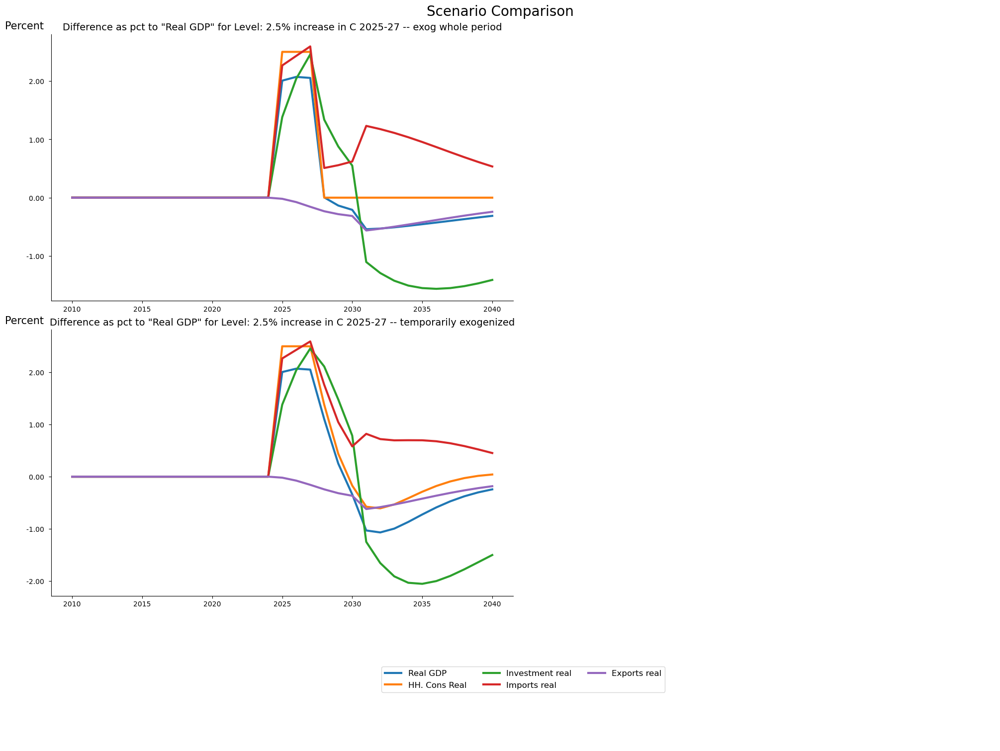

In [39]:
var_fig.axes[1].remove()
var_fig

The same mechanism can be used to revise the titles of the indidividual charts and annotate them.

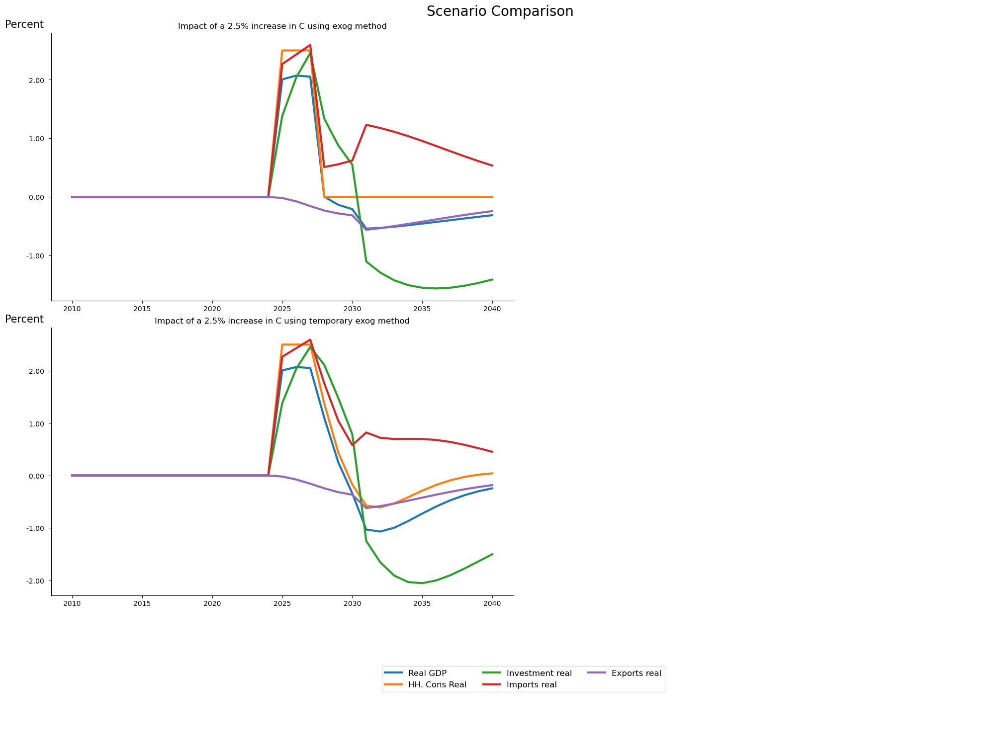

In [40]:
var_fig.axes[0].set_title('Impact of a 2.5% increase in C using exog method');    # many properties can be set afterward 
var_fig.axes[1].set_title('Impact of a 2.5% increase in C using temporary exog method');
var_fig

:::{index} single: Mathplotlib; revise charts after built
:::




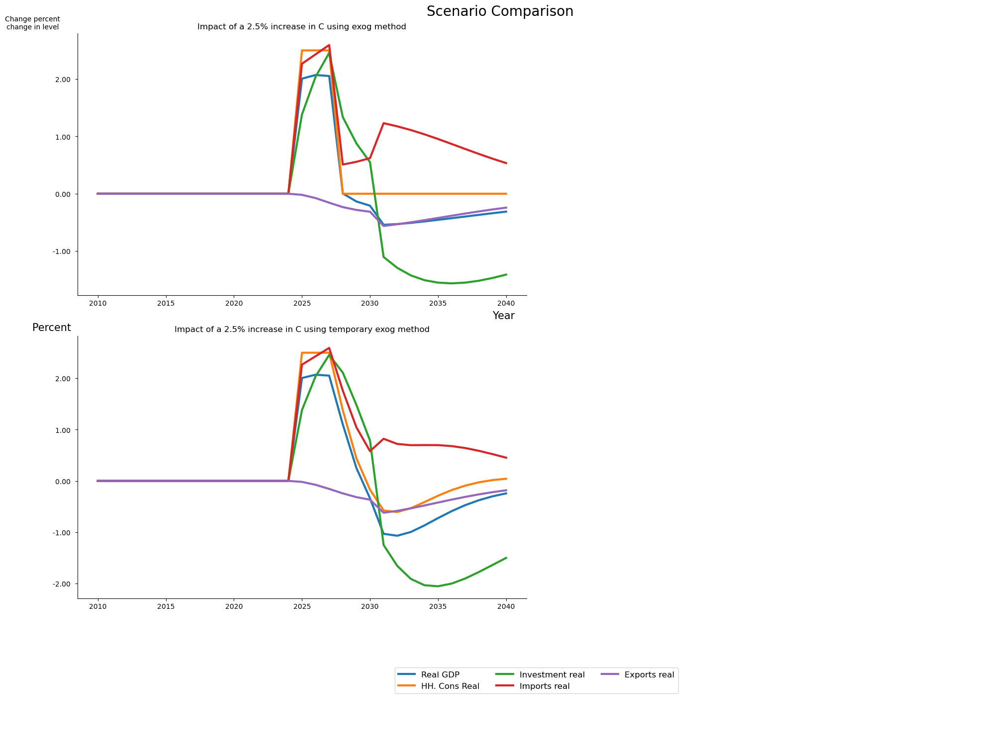

In [41]:
var_fig.axes[0].set_xlabel('Year')
var_fig.axes[0].set_ylabel('Change percent\nchange in level',fontsize=10)
var_fig.axes[0].yaxis.set_label_coords(-0.1,1.02)
var_fig.axes[0].xaxis.set_label_coords(.95,-.06)
var_fig

Variables pointing to the individual charts can be defined and used to make modifications to individual charts within the overall figure.



In [42]:
fig1=var_fig.axes[0]
fig2=var_fig.axes[1]

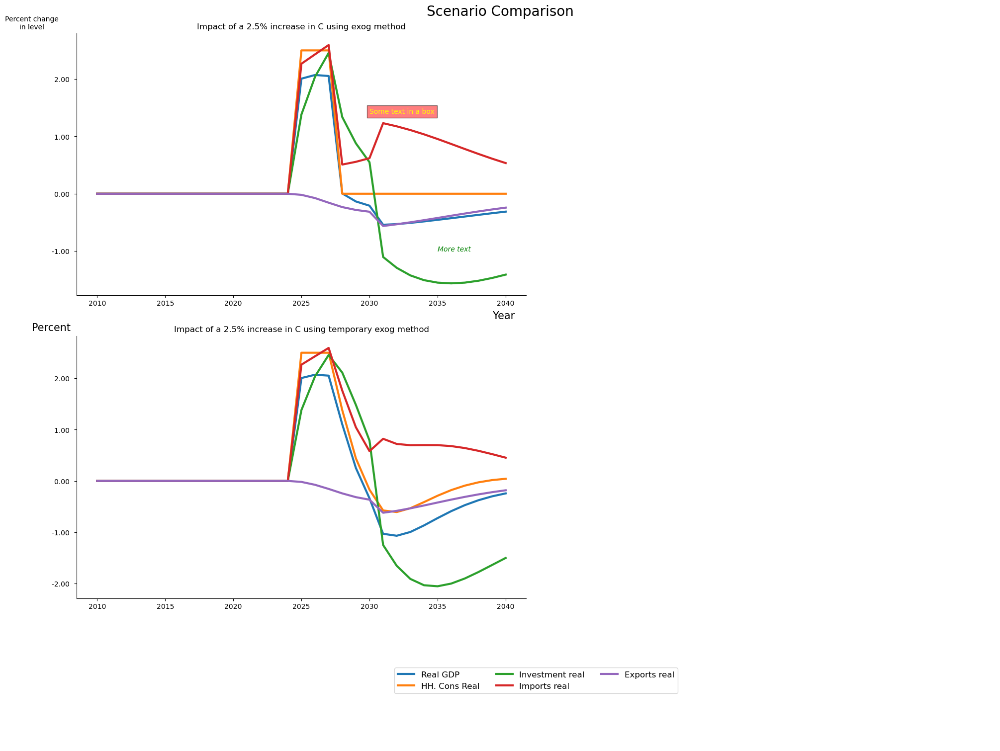

In [43]:
fig1.set_ylabel('Percent change\nin level',fontsize=10)
fig1.yaxis.set_label_coords(-0.1,1.02) #place axes labels
fig1.xaxis.set_label_coords(.95,-.06)



fig1.text(2030.,1.4, 'Some text in a box', 
          color='yellow',bbox=dict(facecolor='red', alpha=0.5));
fig1.text(2035.,-1., 'More text', 
          style='italic',color='green');
          
var_fig
          

:::{index} single: Graphs; save mathoplotlib figure to file
:::
:::{index} single: Figures; save as PNG
:::
:::{index} single: Figures; save as SVG
:::
:::{index} single: Figures; save as JPG
:::
:::{index} single: Figures; save as PDF
:::

### Save plots as files. 
The `.savefigs` function is used to save the plots for publication or other later use: 

| Parameter       | Type   | Default    | Description |
|-----------------|--------|------------|-------------|
| figs            | dict   | -          | A dictionary of matplotlib figures where the key is the figure name. |
| location        | str    | './graph'  | The base folder in which to save the charts. |
| experimentname  | str    | 'experiment1' | A subfolder under 'location' where charts are saved. |
| addname         | str    | ''         | An additional name added to each figure filename. |
| extensions      | list   | ['svg']    | A list of string file extensions for saving the figures. |
| xopen           | bool   | True       | If True, open the saved figure locations in a web browser. |

It will return the location where the files are saved


In [44]:
mpak.savefigs(var_figs,extensions=['pdf','png'],xopen=False);

## Interactive widgets

Modelflow running in a Jupyter Notebook includes two interactive widgets that reproduce much of the functionality described above.  

The main widget pertains to all modelflow model objects and is called 

```
mpak['#Headline'] #display a widget for all the variables defined in the headline group

or
mpak['PAK*EMIS*'] #display a widget of all the emission variables
```

The widget by definition will show tables and graphs for the value and growth rates of the requested variables from both the `.basedf` and `.latestdf` and latest, as well as their differences, differences in growth rates, pecent change in levels/

In [45]:
mpak['#Headline']



In [46]:
mpak['PAK*EMIS*']

:::{index} single: keep_show(); interactive keep_plot
:::

### `.keep_show()` Interactive widget for keep_plot 

The .keep_show() method does preapres similar outputs for simulations that have been stored via the `keep` option. 

```.keep_show()```

This will show a interactive widget which allows  the user to design scenario charts as shown below.  

In [47]:
mpak.keep_show(legend=1) 

:::{image} keep_show_1.png
    :alt: Menu to start notebooks in subfolders
    :class: bg-primary mb-1
    :width: 90%
    :align: center
:::   

:::{index} single: keep_show(); save chart to file
:::

### Save charts to file. 
When the `Allow save to file` checkbox is checked, an additional widget is displayed. This can be used to save the charts in a number of formats. As a default the charts are saved in `graph/experiment name`.  

### savefig method

The savfig method is a standard mathplotlib method that can be used to sabe a figure using a range of different formats.

:::{image} keep_show_file_save.png
    :alt: Menu to start notebooks in subfolders
    :class: bg-primary mb-1
    :width: 90%
    :align: center
:::   

### Settings 
There are a number of settings which allows the user to customize the inputs required by  the widget. 

| Parameter          | Type          | Description                                                                                       |
|--------------------|---------------|---------------------------------------------------------------------------------------------------|
| `smpl`             | Tuple         | The selected sample, a tuple with 2 elements, matching the dataframe index. Defaults to ('','').  |
| `use_smpl`         | False         | Show a sample selection slider.                                                                    |
| `selectfrom`       | List          | The variables to select from. Defaults to [] (all kept variables).                                |
| `legend`           | False          | Show legends or to the right of the curve.                                    |
| `dec`              | String        | Decimals on the y-axis. Defaults to '0'.                                                           |
| `use_descriptions` | True          | Use the variable descriptions from the model.                                                      |
| `vline`            | List          | List of vertical lines (position, text).                                                           |
| `add_var_name`     | False          | Add the variable name to description.                                                              |
| `short`            | 0, 1 or 2     | Short, 1 or 2 cut down on the input fields.                                                        |
| `select_scenario`  |True          | Allow selection of scenarios for which charts are displayed.                                                   |
| `switch`           | False          | Use the scenarios in `mmodel.basedf` and `mmodel.lastdf`.                                          |
| `var_groups`       | Dict          | A dictionary of variable patterns to select, e.g., countries.                                      |
| `use_var_groups`   | True          | Use the `var_groups`.                                                                              |
| `displaytype`      | String        | Display type, one of ['tab', 'accordion', 'anything'].                                             |
| `save_location`    | String        | Default save location.                                                                             |
| `relativ_start`    | Int           | Relative start.                                                                                    |
| `selected`         | String        | Selected item.                                                                                     |
| `select_width`     | String        | Width of the selection widget.                                                                     |
| `select_height`    | String        | Height of the selection widget.                                                                    |


### .keep_show() call with most common options
The following shows a call when the most used options has been set explicitly. If a parameter is not set explicitly the default will be used.

In [48]:
mpak.keep_show(
select_scenario = True,  # default = False, allow selection of scenarios to display 
use_smpl        = True,  # default = False, allow selection of display smpl 
use_descriptions= True, # default = True,  use descriptions from model  
add_var_name    = False, # default = False, add variable name to description
switch          = False, # default = False, use basedf and lastdf as scenarios
use_var_groups  = True,  # default = True, show selection menu based on var_groups 
var_groups      = mpak.var_groups,  # default = .var_groups Grouping of variable to be used.
selectfrom     = 'PAK*',  # default = '*' Select variables  
legend         = True, # Default= False show legend     
)